In [4]:
import os
import pickle
import matplotlib.pyplot as plt  # import plt before librosa, conflict!
import librosa
import numpy as np
import pandas as pd
from tqdm import tqdm
import librosa.display
from sklearn.decomposition import PCA

PICKLE_DIR = 'D:\9999_OneDrive_ZHAW\OneDrive - ZHAW\BA_ZHAW_RTO\pickle'
PICKLE_DIR_SMALL = 'D:\9999_OneDrive_ZHAW\OneDrive - ZHAW\BA_ZHAW_RTO\pickle\subset'
root = 'Z:\\BA\\mimii_baseline\\dataset'

n_fft = 1024
hop_length = 512
n_mels = 64
frames = 5

# Functions

In [8]:
def file_names(root, db_levels=None, ids=None, file_types=None, num_files=None):
    files = []
    
    if db_levels is None:
        db_levels = ['0dB', '6dB', 'min6dB']
    
    if ids is None:
        ids = ['id_00', 'id_02', 'id_04', 'id_06']
        
    if file_types is None:
        file_types = ['normal', 'abnormal']

    combinations = len(db_levels) * len(ids) * len(file_types)
    
    if num_files is not None:
        files_per_combination = num_files // combinations
    else:
        files_per_combination = None

    for db_level in db_levels:
        for id_ in ids:
            for file_type in file_types:
                folder_path = os.path.join(root, db_level, 'pump', id_, file_type)
                
                for idx, file_name in enumerate(os.listdir(folder_path)):
                    if files_per_combination is not None and idx >= files_per_combination:
                        break
                    
                    file_path = os.path.join(folder_path, file_name)
                    files.append(file_path)

    return files


def dataloader(files_list, n_fft=1024, hop_length=512, n_mels=64, frames=5):
    dims = n_mels * frames
    
    for idx in tqdm(range(len(files_list)), desc='Dataloader: '):
        signal, sr = file_load(files_list[idx])
        features = extract_features(
        signal,
        sr,
        n_fft=n_fft,
        hop_length=hop_length,
        n_mels=n_mels,
        frames=frames,
        )
        
        if idx == 0:
            dataset = np.zeros((features.shape[0] * len(files_list), dims), np.float32)
        
        dataset[
            features.shape[0] * idx : features.shape[0] * (idx + 1), :
        ] = features
        
    return dataset
        

def file_load(wav_name, mono=False, channel=0):
    signal, sr = librosa.load(wav_name, mono=False, sr=None)
    if signal.ndim <= 1:
        sound_file = signal, sr
    else:
        sound_file = signal[channel, :], sr

    return sound_file
  
    
def extract_features(signal, sr, n_fft=1024, hop_length=512, 
                     n_mels=64, frames=5):
    mel_spectrogram = librosa.feature.melspectrogram(
        y=signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels
    )
    log_mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    features_vector_size = log_mel_spectrogram.shape[1] - frames + 1
    
    dims = frames * n_mels

    if features_vector_size < 1:
        return np.empty((0, dims), np.float32)

    features = np.zeros((features_vector_size, dims), np.float32)
    for time in range(frames):
        features[:, n_mels * time : n_mels * (time + 1)] = log_mel_spectrogram[
            :, time : time + features_vector_size
        ].T

    return features


# pickle I/O
def save_pickle(filename, save_data, root=PICKLE_DIR):
    """
    picklenize the data.

    filename : str
        pickle filename
    data : free datatype
        some data will be picklenized

    return : None
    """
    filepath = os.path.join(root, filename) + '.pickle'
    with open(filepath, 'wb') as sf:
        pickle.dump(save_data, sf)


def load_pickle(filename, root=PICKLE_DIR):
    """
    unpicklenize the data.

    filename : str
        pickle filename

    return : data
    """
    filepath = os.path.join(root, filename) + '.pickle'
    with open(filepath, 'rb') as lf:
        load_data = pickle.load(lf)
    return load_data


# Normalization
def normalize_data(x, lb, ub, max_v=1.0, min_v=-1.0):
    '''
    Max-Min normalize of 'x' with max value 'max_v' min value 'min_v'
    '''

    # Set-up
    if len(ub)==0:
        ub = x.max(0) # OPTION 1
        # applied to the first dimension (0) columns of the data
        #ub = np.percentile(x, 99.9, axis=0, keepdims=True) # OPTION 2:
        
    if len(lb)==0:
        lb = x.min(0) 
        #lb = np.percentile(x, 0.1, axis=0, keepdims=True)
    
    ub.shape = (1,-1)
    lb.shape = (1,-1)           
    max_min = max_v - min_v
    delta = ub-lb

    # Compute
    x_n = max_min * (x - lb) / delta + min_v
    if 0 in delta:
        idx = np.ravel(delta == 0)
        x_n[:,idx] = x[:,idx] - lb[:, idx]

    return x_n, lb, ub 

# advanced data loader which also normalizes and saves the data
# the dataloader can be used to load single machines with different dB
# be aware that the file naming may differ if you use it for total 6dB
# or total machines at each dB. not tested yet.
def dataloader_adv(root, db_levels, ids, file_types, n_fft, hop_length, n_mels, frames, pickle_dir, num_files=None):
    """
    load files and save the directory names in a list
    create labels using the "normal", "abnormal" statement in the file_paths
    use dataloader to load sound data from files
    normalize data the data to use for AE
    save all the data as .pickle to easily load afterwards
    """
    
    
    # Load file locations
    file_locs = file_names(root, db_levels=db_levels, ids=ids, file_types=file_types, num_files=num_files)

    # Feature labelling
    labels = np.zeros(len(file_locs)) if 'normal' in file_types else np.ones(len(file_locs))

    # Load and process data
    data = dataloader(file_locs, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)
    
    # Normalize data
    data_n, _, _ = normalize_data(data, [], [], max_v=1.0, min_v=0.0)
    
    # Save data and labels as pickle files
#     for id_ in ids:
#         id_ = id_.replace('_', '')
#         norm_abnorm = 'norm' if file_types[0] == 'normal' else 'abnorm'
#         save_pickle(f'{id_}_{db_levels[0]}_{norm_abnorm}', file_locs, root=pickle_dir)
#         save_pickle(f'{id_}_{db_levels[0]}_{norm_abnorm}_data', data, root=pickle_dir)
#         save_pickle(f'{id_}_{db_levels[0]}_{norm_abnorm}_labels', labels, root=pickle_dir)
#         save_pickle(f'{id_}_{db_levels[0]}_{norm_abnorm}_data_n', data_n, root=pickle_dir)

    id_str = '_'.join([id_.replace('_', '') for id_ in ids])
    db_str = '_'.join(db_levels)
    norm_abnorm = 'norm' if file_types[0] == 'normal' else 'abnorm'
    file_prefix = f'{id_str}_{db_str}_{norm_abnorm}'
    save_pickle(f'{file_prefix}', file_locs, root=pickle_dir)
    save_pickle(f'{file_prefix}_data', data, root=pickle_dir)
    save_pickle(f'{file_prefix}_labels', labels, root=pickle_dir)
    save_pickle(f'{file_prefix}_data_n', data_n, root=pickle_dir)

    return file_locs, labels, data, data_n


# plots pca
def plot_pca_machine_db(six, zero, minus, m_id, type_id):
    # Perform PCA
    pca = PCA(n_components=2)
    pca_6dB = pca.fit_transform(six)
    pca_0dB = pca.fit_transform(zero)
    pca_min6dB = pca.fit_transform(minus)


    # Create scatter plot
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.scatter(pca_6dB[:, 0], pca_6dB[:, 1], c='r', label='6dB', alpha=0.5)
    ax.scatter(pca_0dB[:, 0], pca_0dB[:, 1], c='g', label='0dB', alpha=0.5)
    ax.scatter(pca_min6dB[:, 0], pca_min6dB[:, 1], c='b', label='-6dB', alpha=0.5)

    ax.set_title(f'PCA: Machine id{m_id} - {type_id} - Different dB Levels')
    ax.set_xlabel("PC 1")
    ax.set_ylabel("PC 2")
    ax.legend()
    plt.show()
    
def sort_machine_dB(id_data, id_data_n):
    # Separate the file names based on dB levels
    id_data_files_6dB = [file for file in id_data if '6dB' in file]
    id_data_files_0dB = [file for file in id_data if '0dB' in file]
    id_data_files_min6dB = [file for file in id_data if 'min6dB' in file]

    # Get the indices of the normal file names
    indices_norm_6dB = [id_data.index(file) for file in id_data_files_6dB]
    indices_norm_0dB = [id_data.index(file) for file in id_data_files_0dB]
    indices_norm_min6dB = [id_data.index(file) for file in id_data_files_min6dB]

    # Separate the data based on dB levels using indices
    id_six = id_data_n[indices_norm_6dB]
    id_zero = id_data_n[indices_norm_0dB]
    id_min_six = id_data_n[indices_norm_min6dB]
    
    return id_six, id_zero, id_min_six

In [23]:
# Load all files
all_files = file_names(root)

# Load files from specific dB levels and IDs
specific_files = file_names(root, db_levels=['0dB', '6dB'], ids=['id_00', 'id_04'])

# Load normal files only
normal_files = file_names(root, file_types=['normal'])

# Load a limited number of files from each folder
limited_files = file_names(root, num_files=10)

# Load evenly distributed files across specified dB levels, IDs, and file types
evenly_distributed_files = file_names(root, db_levels=['0dB', '6dB'], ids=['id_00', 'id_04'], num_files=20)

# load data

In [12]:
combinations = [
    (['6dB'], ['id_00', 'id_02', 'id_04', 'id_06']),
    (['0dB'], ['id_00', 'id_02', 'id_04', 'id_06']),
    (['min6dB'], ['id_00', 'id_02', 'id_04', 'id_06']),
    (['6dB', '0dB', 'min6dB'], ['id_00']),
    (['6dB'], ['id_00']),
    (['0dB'], ['id_00']),
    (['min6dB'], ['id_00']),
    (['6dB', '0dB', 'min6dB'], ['id_02']),
    (['6dB'], ['id_02']),
    (['0dB'], ['id_02']),
    (['min6dB'], ['id_02']),
    (['6dB', '0dB', 'min6dB'], ['id_04']),
    (['6dB'], ['id_04']),
    (['0dB'], ['id_04']),
    (['min6dB'], ['id_04']),
    (['6dB', '0dB', 'min6dB'], ['id_06']),
    (['6dB'], ['id_06']),
    (['0dB'], ['id_06']),
    (['min6dB'], ['id_06']),
]

num_files = 200

file_types = ['normal', 'abnormal']

for db_level, id_ in combinations:
    for file_type in file_types:
        file_locs, labels, data, data_n = dataloader_adv(root, db_level, id_, [file_type], n_fft, hop_length, n_mels, frames, PICKLE_DIR_SMALL, num_files=num_files)


Dataloader: 100%|████████████████████████████████████████████████████████████████████| 102/102 [00:09<00:00, 10.28it/s]


## load total 6dB

In [24]:
six_00_norm = file_names(root, db_levels=['6dB'], ids=['id_00'], file_types=['normal'])
six_00_abnorm = file_names(root, db_levels=['6dB'], ids=['id_00'], file_types=['abnormal'])

six_02_norm = file_names(root, db_levels=['6dB'], ids=['id_02'], file_types=['normal'])
six_02_abnorm = file_names(root, db_levels=['6dB'], ids=['id_02'], file_types=['abnormal'])

six_04_norm = file_names(root, db_levels=['6dB'], ids=['id_04'], file_types=['normal'])
six_04_abnorm = file_names(root, db_levels=['6dB'], ids=['id_04'], file_types=['abnormal'])

six_06_norm = file_names(root, db_levels=['6dB'], ids=['id_06'], file_types=['normal'])
six_06_abnorm = file_names(root, db_levels=['6dB'], ids=['id_06'], file_types=['abnormal'])

six_norm = file_names(root, db_levels=['6dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'], file_types=['normal'])
six_abnorm = file_names(root, db_levels=['6dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'], file_types=['abnormal'])

six_all = file_names(root, db_levels=['6dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'])

print(len(six_00_norm), len(six_00_abnorm))
print(len(six_02_norm), len(six_02_abnorm))
print(len(six_04_norm), len(six_04_abnorm))
print(len(six_06_norm), len(six_06_abnorm))
print(len(six_norm), len(six_abnorm))
print(len(six_all))

1006 143
1005 111
702 100
1036 102
3749 456
4205


In [10]:
# takes about 5 minutes
n_fft = 1024
hop_length = 512
n_mels = 64
frames = 5

dim_1 = 313 - frames + 1
dim_2 = n_mels * frames

# Load file loacations
six_norm = file_names(root, db_levels=['6dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'], file_types=['normal'], num_files=None)
six_abnorm = file_names(root, db_levels=['6dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'], file_types=['abnormal'],num_files=None)

# Feature labelling
six_norm_labels = np.zeros(len(six_norm))
six_abnorm_labels = np.ones(len(six_abnorm))

# load six_norm_data normal and abnormal
six_norm_data = dataloader(
    six_norm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)
six_abnorm_data = dataloader(
    six_abnorm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)


Dataloader: 100%|████████████████████████████████████████████████████████████████████| 456/456 [00:46<00:00,  9.91it/s]


In [7]:
print(six_norm_data)
print(len(six_norm_data[0]))

[[-20.155865  -20.236065  -16.026154  ... -31.498413  -33.182472
  -33.891582 ]
 [-12.563705  -14.5558815 -10.9439125 ... -28.492458  -29.713936
  -27.130947 ]
 [-14.09877   -16.142235  -10.725767  ... -30.762085  -32.16601
  -31.544228 ]
 ...
 [-15.977767  -12.785432  -11.804414  ... -49.596077  -48.799778
  -49.476894 ]
 [-17.91158   -15.174163  -11.011971  ... -49.374844  -50.148117
  -51.661472 ]
 [-20.292229  -14.5499735 -13.1207285 ... -49.63104   -49.726723
  -50.732418 ]]
320


In [11]:
save_pickle('six_norm', six_norm)
save_pickle('six_abnorm', six_abnorm)
save_pickle('six_norm_data', six_norm_data)
save_pickle('six_abnorm_data', six_abnorm_data)

In [25]:
six_norm = load_pickle('six_norm')
six_abnorm = load_pickle('six_abnorm')
six_norm_data = load_pickle('six_norm_data')
six_abnorm_data = load_pickle('six_abnorm_data')

## load total 0dB

In [114]:
# Load file loacations
zero_norm = file_names(root, db_levels=['0dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'], file_types=['normal'])
zero_abnorm = file_names(root, db_levels=['0dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'], file_types=['abnormal'])

# Feature labelling
zero_norm_labels = np.zeros(len(zero_norm))
zero_abnorm_labels = np.ones(len(zero_abnorm))
print(len(zero_norm))
print(len(zero_abnorm))

3749
456


In [116]:
# takes about 5 minutes
n_fft = 1024
hop_length = 512
n_mels = 64
frames = 5

dim_1 = 313 - frames + 1
dim_2 = n_mels * frames

zero_norm_data = dataloader(
    zero_norm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)
zero_abnorm_data = dataloader(
    zero_abnorm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 456/456 [00:45<00:00, 10.13it/s]


In [117]:
save_pickle('zero_norm', zero_norm)
save_pickle('zero_abnorm', zero_abnorm)
save_pickle('zero_norm_data', zero_norm_data)
save_pickle('zero_abnorm_data', zero_abnorm_data)

In [18]:
zero_norm = load_pickle('zero_norm')
zero_abnorm = load_pickle('zero_abnorm')
zero_norm_data = load_pickle('zero_norm_data')
zero_abnorm_data = load_pickle('zero_abnorm_data')

## load total min6dB

In [119]:
# Load file loacations
min_six_norm = file_names(root, db_levels=['min6dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'], file_types=['normal'])
min_six_abnorm = file_names(root, db_levels=['min6dB'], ids=['id_00', 'id_02', 'id_04', 'id_06'], file_types=['abnormal'])

# Feature labelling
min_six_norm_labels = np.zeros(len(min_six_norm))
min_six_abnorm_labels = np.ones(len(min_six_abnorm))
print(len(min_six_norm))
print(len(min_six_abnorm))

3749
456


In [121]:
# takes about 5 minutes
n_fft = 1024
hop_length = 512
n_mels = 64
frames = 5

dim_1 = 313 - frames + 1
dim_2 = n_mels * frames

min_six_norm_data = dataloader(
    min_six_norm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)
min_six_abnorm_data = dataloader(
    min_six_abnorm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 456/456 [00:29<00:00, 15.31it/s]


In [122]:
save_pickle('min_six_norm', min_six_norm)
save_pickle('min_six_abnorm', min_six_abnorm)
save_pickle('min_six_norm_data', min_six_norm_data)
save_pickle('min_six_abnorm_data', min_six_abnorm_data)

In [4]:
min_six_norm = load_pickle('min_six_norm')
min_six_abnorm = load_pickle('min_six_abnorm')
min_six_norm_data = load_pickle('min_six_norm_data')
min_six_abnorm_data = load_pickle('min_six_abnorm_data')

## load partial: id_00 all dB 

In [39]:
id00_all_dB_norm = file_names(root, db_levels=None, ids=['id_00'], file_types=['normal'])
id00_all_dB_abnorm = file_names(root, db_levels=None, ids=['id_00'], file_types=['abnormal'])

id00_all_dB_norm_labels = np.zeros(len(id00_all_dB_norm))
id00_all_dB_abnorm_labels = np.ones(len(id00_all_dB_abnorm))

In [89]:
# takes about 5 minutes
n_fft = 1024
hop_length = 512
n_mels = 64
frames = 5

dim_1 = 313 - frames + 1
dim_2 = n_mels * frames

id00_all_dB_norm_data = dataloader(
    id00_all_dB_norm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)
id00_all_dB_abnorm_data = dataloader(
    id00_all_dB_abnorm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 429/429 [00:26<00:00, 16.30it/s]


In [93]:
save_pickle('id00_all_dB_norm', id00_all_dB_norm)
save_pickle('id00_all_dB_abnorm', id00_all_dB_abnorm)
save_pickle('id00_all_dB_norm_data', id00_all_dB_norm_data)
save_pickle('id00_all_dB_abnorm_data', id00_all_dB_abnorm_data)

In [3]:
id00_all_dB_norm = load_pickle('id00_all_dB_norm')
id00_all_dB_abnorm = load_pickle('id00_all_dB_abnorm')
id00_all_dB_norm_data = load_pickle('id00_all_dB_norm_data')
id00_all_dB_abnorm_data = load_pickle('id00_all_dB_abnorm_data')

### load partial: id_00 6dB 

In [5]:
# normal
id00_6dB_norm, id00_6dB_norm_labels, id00_6dB_norm_data, id00_6dB_norm_data_n = dataloader_adv(
    root, ['6dB'], ['id_00'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR, num_files=None)

# abnormal
id00_6dB_abnorm, id00_6dB_abnorm_labels, id00_6dB_abnorm_data, id00_6dB_abnorm_data_n = dataloader_adv(
    root, ['6dB'], ['id_00'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR, num_files=None)


Dataloader: 100%|████████████████████████████████████████████████████████████████████| 143/143 [00:09<00:00, 14.45it/s]


### load partial: id_00 0dB 

In [11]:
# normal
id00_0dB_norm, id00_0dB_norm_labels, id00_0dB_norm_data, id00_0dB_norm_data_n = dataloader_adv(
    root, ['0dB'], ['id_00'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id00_0dB_abnorm, id00_0dB_abnorm_labels, id00_0dB_abnorm_data, id00_0dB_abnorm_data_n = dataloader_adv(
    root, ['0dB'], ['id_00'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 143/143 [00:07<00:00, 19.74it/s]


### load partial: id_00 -6dB 

In [3]:
# normal
id00_min6dB_norm, id00_min6dB_norm_labels, id00_min6dB_norm_data, id00_min6dB_norm_data_n = dataloader_adv(
    root, ['min6dB'], ['id_00'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id00_min6dB_abnorm, id00_min6dB_abnorm_labels, id00_min6dB_abnorm_data, id00_min6dB_abnorm_data_n = dataloader_adv(
    root, ['min6dB'], ['id_00'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 143/143 [00:09<00:00, 15.38it/s]


## load partial: id_02 all dB 

In [40]:
id02_all_dB_norm = file_names(root, db_levels=None, ids=['id_02'], file_types=['normal'])
id02_all_dB_abnorm = file_names(root, db_levels=None, ids=['id_02'], file_types=['abnormal'])

id02_all_dB_norm_labels = np.zeros(len(id02_all_dB_norm))
id02_all_dB_abnorm_labels = np.ones(len(id02_all_dB_abnorm))

In [42]:
# takes about 5 minutes
n_fft = 1024
hop_length = 512
n_mels = 64
frames = 5

dim_1 = 313 - frames + 1
dim_2 = n_mels * frames

id02_all_dB_norm_data = dataloader(
    id02_all_dB_norm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)
id02_all_dB_abnorm_data = dataloader(
    id02_all_dB_abnorm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 333/333 [00:24<00:00, 13.47it/s]


In [43]:
save_pickle('id02_all_dB_norm', id02_all_dB_norm)
save_pickle('id02_all_dB_abnorm', id02_all_dB_abnorm)
save_pickle('id02_all_dB_norm_data', id02_all_dB_norm_data)
save_pickle('id02_all_dB_abnorm_data', id02_all_dB_abnorm_data)

In [4]:
id02_all_dB_norm = load_pickle('id02_all_dB_norm')
id02_all_dB_abnorm = load_pickle('id02_all_dB_abnorm')
id02_all_dB_norm_data = load_pickle('id02_all_dB_norm_data')
id02_all_dB_abnorm_data = load_pickle('id02_all_dB_abnorm_data')

### load partial: id_02 6dB 

In [13]:
# normal
id02_6dB_norm, id02_6dB_norm_labels, id02_6dB_norm_data, id02_6dB_norm_data_n = dataloader_adv(
    root, ['6dB'], ['id_02'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id02_6dB_abnorm, id02_6dB_abnorm_labels, id02_6dB_abnorm_data, id02_6dB_abnorm_data_n = dataloader_adv(
    root, ['6dB'], ['id_02'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)


Dataloader: 100%|████████████████████████████████████████████████████████████████████| 111/111 [00:07<00:00, 14.79it/s]


### load partial: id_02 0dB 

In [14]:
# normal
id02_0dB_norm, id02_0dB_norm_labels, id02_0dB_norm_data, id02_0dB_norm_data_n = dataloader_adv(
    root, ['0dB'], ['id_02'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id02_0dB_abnorm, id02_0dB_abnorm_labels, id02_0dB_abnorm_data, id02_0dB_abnorm_data_n = dataloader_adv(
    root, ['0dB'], ['id_02'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 111/111 [00:10<00:00, 10.40it/s]


### load partial: id_02 -6dB 

In [15]:
# normal
id02_min6dB_norm, id02_min6dB_norm_labels, id02_min6dB_norm_data, id02_min6dB_norm_data_n = dataloader_adv(
    root, ['min6dB'], ['id_02'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id02_min6dB_abnorm, id02_min6dB_abnorm_labels, id02_min6dB_abnorm_data, id02_min6dB_abnorm_data_n = dataloader_adv(
    root, ['min6dB'], ['id_02'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 111/111 [00:09<00:00, 11.21it/s]


## load partial: id_04 all dB 

In [46]:
id04_all_dB_norm = file_names(root, db_levels=None, ids=['id_04'], file_types=['normal'])
id04_all_dB_abnorm = file_names(root, db_levels=None, ids=['id_04'], file_types=['abnormal'])

id04_all_dB_norm_labels = np.zeros(len(id04_all_dB_norm))
id04_all_dB_abnorm_labels = np.ones(len(id04_all_dB_abnorm))

In [47]:
# takes about 5 minutes
n_fft = 1024
hop_length = 512
n_mels = 64
frames = 5

dim_1 = 313 - frames + 1
dim_2 = n_mels * frames

id04_all_dB_norm_data = dataloader(
    id04_all_dB_norm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)
id04_all_dB_abnorm_data = dataloader(
    id04_all_dB_abnorm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 300/300 [00:42<00:00,  6.98it/s]


In [48]:
save_pickle('id04_all_dB_norm', id04_all_dB_norm)
save_pickle('id04_all_dB_abnorm', id04_all_dB_abnorm)
save_pickle('id04_all_dB_norm_data', id04_all_dB_norm_data)
save_pickle('id04_all_dB_abnorm_data', id04_all_dB_abnorm_data)

In [5]:
id04_all_dB_norm = load_pickle('id04_all_dB_norm')
id04_all_dB_abnorm = load_pickle('id04_all_dB_abnorm')
id04_all_dB_norm_data = load_pickle('id04_all_dB_norm_data')
id04_all_dB_abnorm_data = load_pickle('id04_all_dB_abnorm_data')

### load partial: id_04 6dB 

In [16]:
# normal
id04_6dB_norm, id04_6dB_norm_labels, id04_6dB_norm_data, id04_6dB_norm_data_n = dataloader_adv(
    root, ['6dB'], ['id_04'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id04_6dB_abnorm, id04_6dB_abnorm_labels, id04_6dB_abnorm_data, id04_6dB_abnorm_data_n = dataloader_adv(
    root, ['6dB'], ['id_04'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)


Dataloader: 100%|████████████████████████████████████████████████████████████████████| 100/100 [00:11<00:00,  8.51it/s]


### load partial: id_04 0dB 

In [17]:
# normal
id04_0dB_norm, id04_0dB_norm_labels, id04_0dB_norm_data, id04_0dB_norm_data_n = dataloader_adv(
    root, ['0dB'], ['id_04'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id04_0dB_abnorm, id04_0dB_abnorm_labels, id04_0dB_abnorm_data, id04_0dB_abnorm_data_n = dataloader_adv(
    root, ['0dB'], ['id_04'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 11.23it/s]


### load partial: id_04 -6dB 

In [18]:
# normal
id04_min6dB_norm, id04_min6dB_norm_labels, id04_min6dB_norm_data, id04_min6dB_norm_data_n = dataloader_adv(
    root, ['min6dB'], ['id_04'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id04_min6dB_abnorm, id04_min6dB_abnorm_labels, id04_min6dB_abnorm_data, id04_min6dB_abnorm_data_n = dataloader_adv(
    root, ['min6dB'], ['id_04'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 12.97it/s]


## load partial: id_06 all dB 

In [50]:
id06_all_dB_norm = file_names(root, db_levels=None, ids=['id_06'], file_types=['normal'])
id06_all_dB_abnorm = file_names(root, db_levels=None, ids=['id_06'], file_types=['abnormal'])

id06_all_dB_norm_labels = np.zeros(len(id06_all_dB_norm))
id06_all_dB_abnorm_labels = np.ones(len(id06_all_dB_abnorm))

In [51]:
# takes about 5 minutes
n_fft = 1024
hop_length = 512
n_mels = 64
frames = 5

dim_1 = 313 - frames + 1
dim_2 = n_mels * frames

id06_all_dB_norm_data = dataloader(
    id06_all_dB_norm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)
id06_all_dB_abnorm_data = dataloader(
    id06_all_dB_abnorm, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, frames=frames)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 306/306 [00:27<00:00, 11.22it/s]


In [52]:
save_pickle('id06_all_dB_norm', id06_all_dB_norm)
save_pickle('id06_all_dB_abnorm', id06_all_dB_abnorm)
save_pickle('id06_all_dB_norm_data', id06_all_dB_norm_data)
save_pickle('id06_all_dB_abnorm_data', id06_all_dB_abnorm_data)

In [6]:
id06_all_dB_norm = load_pickle('id06_all_dB_norm')
id06_all_dB_abnorm = load_pickle('id06_all_dB_abnorm')
id06_all_dB_norm_data = load_pickle('id06_all_dB_norm_data')
id06_all_dB_abnorm_data = load_pickle('id06_all_dB_abnorm_data')

### load partial: id_06 6dB 

In [19]:
# normal
id06_6dB_norm, id06_6dB_norm_labels, id06_6dB_norm_data, id06_6dB_norm_data_n = dataloader_adv(
    root, ['6dB'], ['id_06'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id06_6dB_abnorm, id06_6dB_abnorm_labels, id06_6dB_abnorm_data, id06_6dB_abnorm_data_n = dataloader_adv(
    root, ['6dB'], ['id_06'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)


Dataloader: 100%|████████████████████████████████████████████████████████████████████| 102/102 [00:13<00:00,  7.80it/s]


### load partial: id_06 0dB 

In [20]:
# normal
id06_0dB_norm, id06_0dB_norm_labels, id06_0dB_norm_data, id06_0dB_norm_data_n = dataloader_adv(
    root, ['0dB'], ['id_06'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id06_0dB_abnorm, id06_0dB_abnorm_labels, id06_0dB_abnorm_data, id06_0dB_abnorm_data_n = dataloader_adv(
    root, ['0dB'], ['id_06'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 102/102 [00:26<00:00,  3.87it/s]


### load partial: id_06 -6dB 

In [21]:
# normal
id06_min6dB_norm, id06_min6dB_norm_labels, id06_min6dB_norm_data, id06_min6dB_norm_data_n = dataloader_adv(
    root, ['min6dB'], ['id_06'], ['normal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

# abnormal
id06_min6dB_abnorm, id06_min6dB_abnorm_labels, id06_min6dB_abnorm_data, id06_min6dB_abnorm_data_n = dataloader_adv(
    root, ['min6dB'], ['id_06'], ['abnormal'], n_fft, hop_length, n_mels, frames, PICKLE_DIR)

Dataloader: 100%|████████████████████████████████████████████████████████████████████| 102/102 [00:10<00:00,  9.51it/s]


# reshape data to 3D for spectrogram

The reshaping step is done to reorganize the data into a 3D format that makes it easier to work with when analyzing audio data. In this case, it seems that dim_1 corresponds to the number of time frames, and dim_2 corresponds to the number of mel frequency bands multiplied by the number of frames.

The reshaping is performed as follows:

normal_data and abnormal_data are reshaped into 3D arrays with dimensions: (samples, dim_1, dim_2). The samples dimension represents the number of audio files, dim_1 represents the time frames, and dim_2 represents the mel frequency bands multiplied by the number of frames.
normal_data_resh and abnormal_data_resh are then concatenated along the first axis (samples) to create a single 3D array called data_resh.

In [35]:
def reshape_data(normal_data, abnormal_data, frames, n_mels):
    dim_1 = 313 - frames + 1
    dim_2 = n_mels * frames

    normal_data_resh = normal_data.reshape(int(normal_data.shape[0] / dim_1), dim_1, dim_2)
    abnormal_data_resh = abnormal_data.reshape(int(abnormal_data.shape[0] / dim_1), dim_1, dim_2)

    return normal_data_resh, abnormal_data_resh


In [36]:
n_mels = 64
frames = 5
six_norm_resh, six_abnorm_resh = reshape_data(six_norm_data, six_abnorm_data, frames=frames, n_mels=n_mels)


In [37]:
print(six_norm_resh[0])
print(len(six_norm_resh[0]))

[[-20.155865  -20.236065  -16.026154  ... -31.498413  -33.182472
  -33.891582 ]
 [-12.563705  -14.5558815 -10.9439125 ... -28.492458  -29.713936
  -27.130947 ]
 [-14.09877   -16.142235  -10.725767  ... -30.762085  -32.16601
  -31.544228 ]
 ...
 [-15.199739  -12.418951  -12.241966  ... -31.563438  -31.347225
  -31.381538 ]
 [-12.651146  -12.740814   -5.7199745 ... -29.44743   -29.09539
  -28.265282 ]
 [-10.292263  -13.19899    -8.907797  ... -29.134132  -28.441452
  -30.727715 ]]
309


# Plot spectrogram

In [77]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import random
import os

def plot_examples(normal_files, abnormal_files, n_examples=3, hop_length=512, n_fft=1024, random_samples=False):
    fig, axs = plt.subplots(n_examples, 2, figsize=(24, 10 * n_examples))

    if random_samples:
        normal_indices = random.sample(range(len(normal_files)), n_examples)
        abnormal_indices = random.sample(range(len(abnormal_files)), n_examples)
    else:
        normal_indices = list(range(n_examples))
        abnormal_indices = list(range(n_examples))

    for i in range(n_examples):
        # Load and process the normal examples
        file_norm = normal_files[normal_indices[i]]
        id_norm = os.path.dirname(file_norm).split("\\")[-2]
        y_norm, sr_norm = librosa.load(file_norm)
        D_norm = librosa.stft(y_norm, hop_length=hop_length, n_fft=n_fft)
        S_db_norm = librosa.amplitude_to_db(np.abs(D_norm), ref=np.max)

        # Plot normal example
        img_norm = librosa.display.specshow(
            S_db_norm,
            sr=sr_norm,
            hop_length=hop_length,
            x_axis='time',
            y_axis='log',
            ax=axs[i, 0]
        )
        axs[i, 0].set_title(f'Pump: {id_norm} - Normal {i+1} - Index #{normal_indices[i]}', fontsize=22)
        axs[i, 0].set_xlabel('Time', fontsize=22)
        axs[i, 0].set_ylabel('Frequency [Hz]', fontsize=22)
        axs[i, 0].tick_params(axis='both', labelsize=22)
        
        color_bar = fig.colorbar(img_norm, ax=axs[i, 0], format="%+2.f dB")
        color_bar.ax.tick_params(labelsize=22)
        
        # Load and process abnormal example
        file_abnorm = abnormal_files[abnormal_indices[i]]
        id_abnorm = os.path.dirname(file_abnorm).split("\\")[-2]
        y_abnorm, sr_abnorm = librosa.load(file_abnorm)
        D_abnorm = librosa.stft(y_abnorm, hop_length=hop_length, n_fft=n_fft)
        S_db_abnorm = librosa.amplitude_to_db(np.abs(D_abnorm), ref=np.max)

        # Plot abnormal example
        img_abnorm = librosa.display.specshow(
            S_db_abnorm,
            sr=sr_abnorm,
            hop_length=hop_length,
            x_axis='time',
            y_axis='log',
            ax=axs[i, 1]
        )
        axs[i, 1].set_title(f'Pump: {id_abnorm} - Abnormal {i+1} - Index #{abnormal_indices[i]}', fontsize=22)
        axs[i, 1].set_xlabel('Time', fontsize=22)
        axs[i, 1].set_ylabel('Frequency [Hz]', fontsize=22)
        axs[i, 1].tick_params(axis='both', labelsize=22)
        
        color_bar = fig.colorbar(img_abnorm, ax=axs[i, 1], format="%+2.f dB")
        color_bar.ax.tick_params(labelsize=22)
        
    plt.tight_layout()
    plt.show()

In [71]:
def plot_single_example(file, example_type='normal', hop_length=512, n_fft=1024):
    # Extract information from the file path
    id_num = os.path.dirname(file).split("\\")[-2]
    file_index = os.path.basename(file).split('.')[0]

    # Load and process the example
    y, sr = librosa.load(file)
    D = librosa.stft(y, hop_length=hop_length, n_fft=n_fft)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    # Plot the example
    fig, ax = plt.subplots(figsize=(24, 10))
    img = librosa.display.specshow(
        S_db,
        sr=sr,
        hop_length=hop_length,
        x_axis='time',
        y_axis='log',
        ax=ax
    )
    ax.set_title(f'Pump: {id_num} - {example_type.capitalize()} - Index #{file_index}', fontsize=22)
    ax.set_xlabel('Time', fontsize=22)
    ax.set_ylabel('Frequency [Hz]', fontsize=22)
    ax.tick_params(axis='both', labelsize=22)

    color_bar = fig.colorbar(img, ax=ax, format="%+2.f dB")
    color_bar.ax.tick_params(labelsize=22)
    plt.tight_layout()
    plt.show()


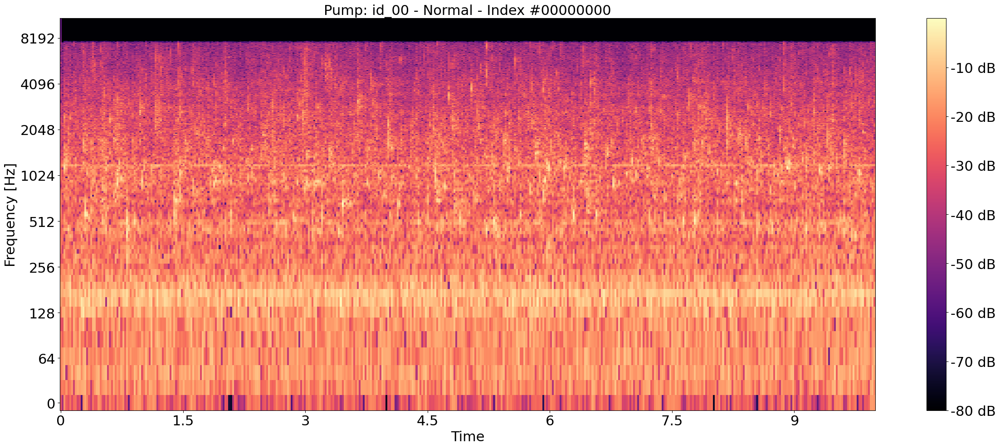

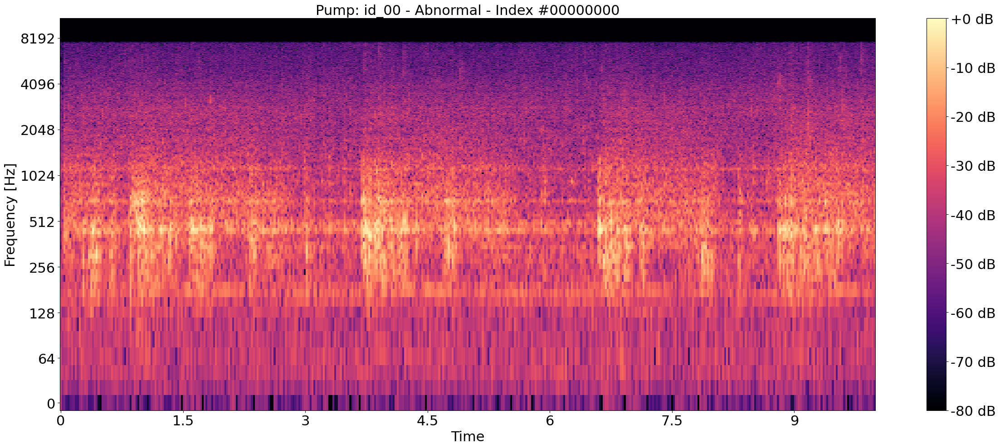

In [72]:
# Plot a normal example
plot_single_example(six_norm[0], example_type='normal', hop_length=512, n_fft=1024)

# Plot an abnormal example
plot_single_example(six_abnorm[0], example_type='abnormal', hop_length=512, n_fft=1024)


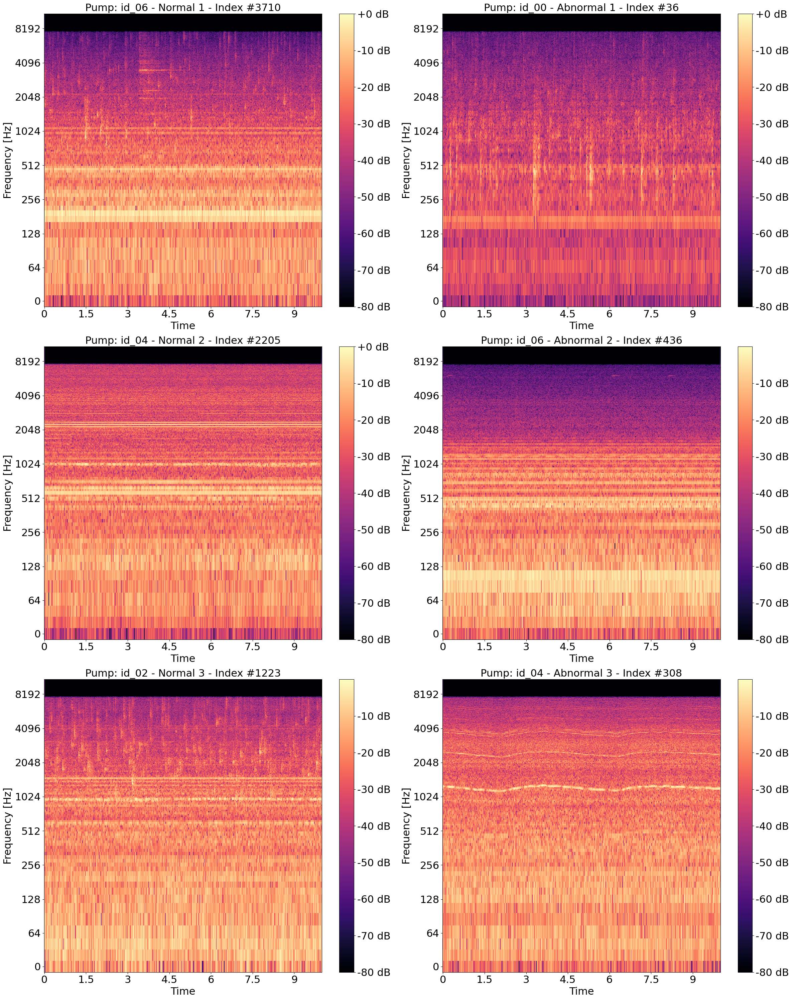

In [78]:
# Call the function with random_samples=False for the first n_examples samples
plot_examples(six_norm, six_abnorm, n_examples=3, hop_length=512, n_fft=1024, random_samples=True)

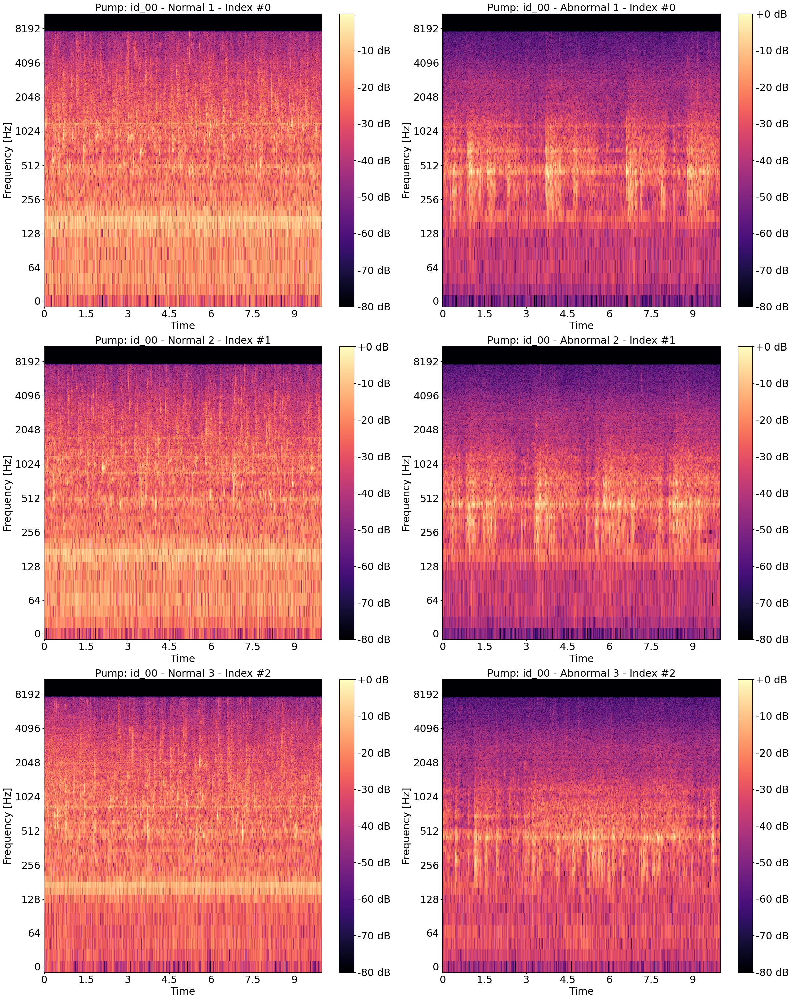

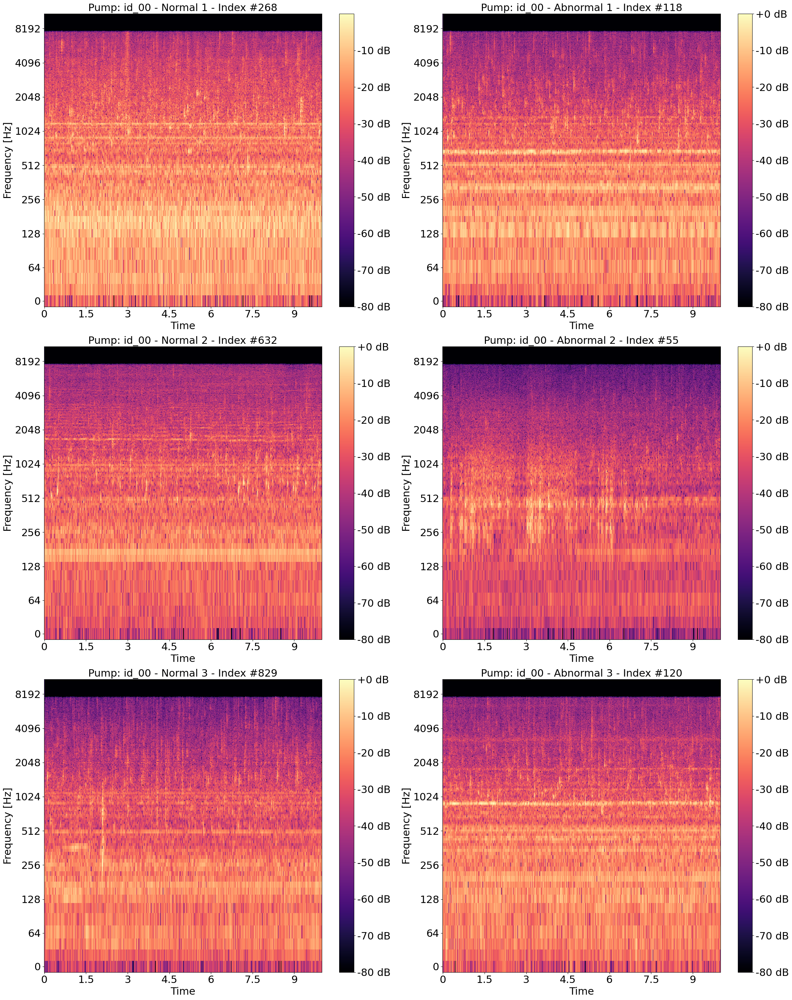

In [79]:
plot_examples(six_00_norm, six_00_abnorm, n_examples=3, hop_length=512, n_fft=1024, random_samples=False)

plot_examples(six_00_norm, six_00_abnorm, n_examples=3, hop_length=512, n_fft=1024, random_samples=True)


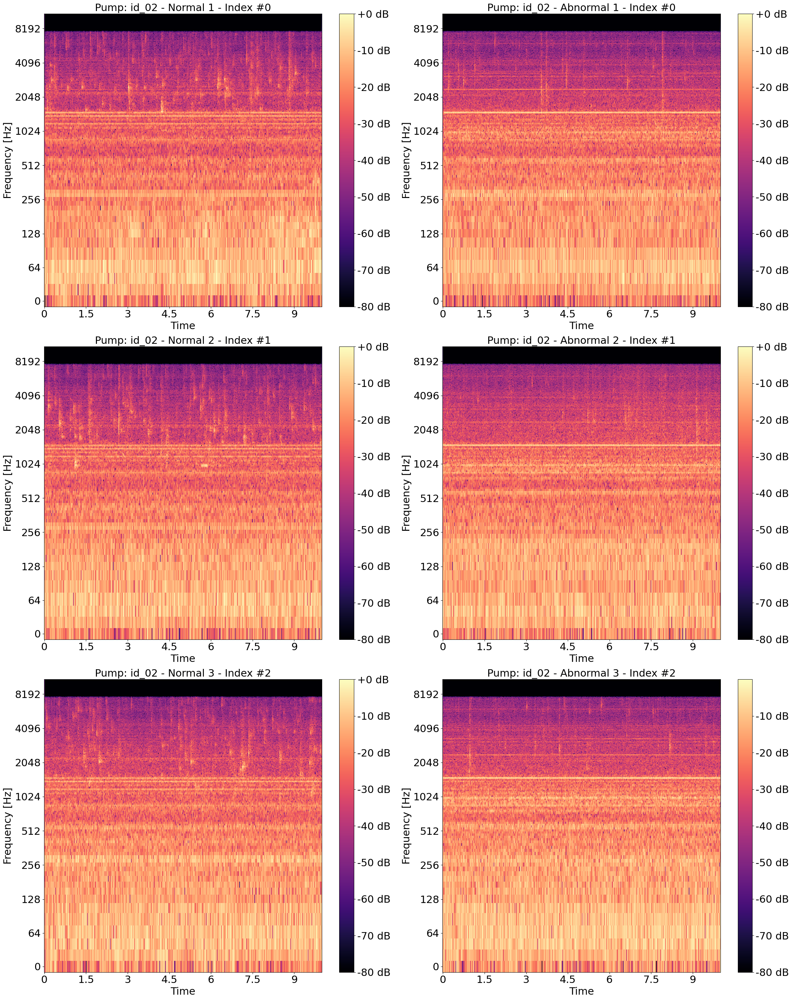

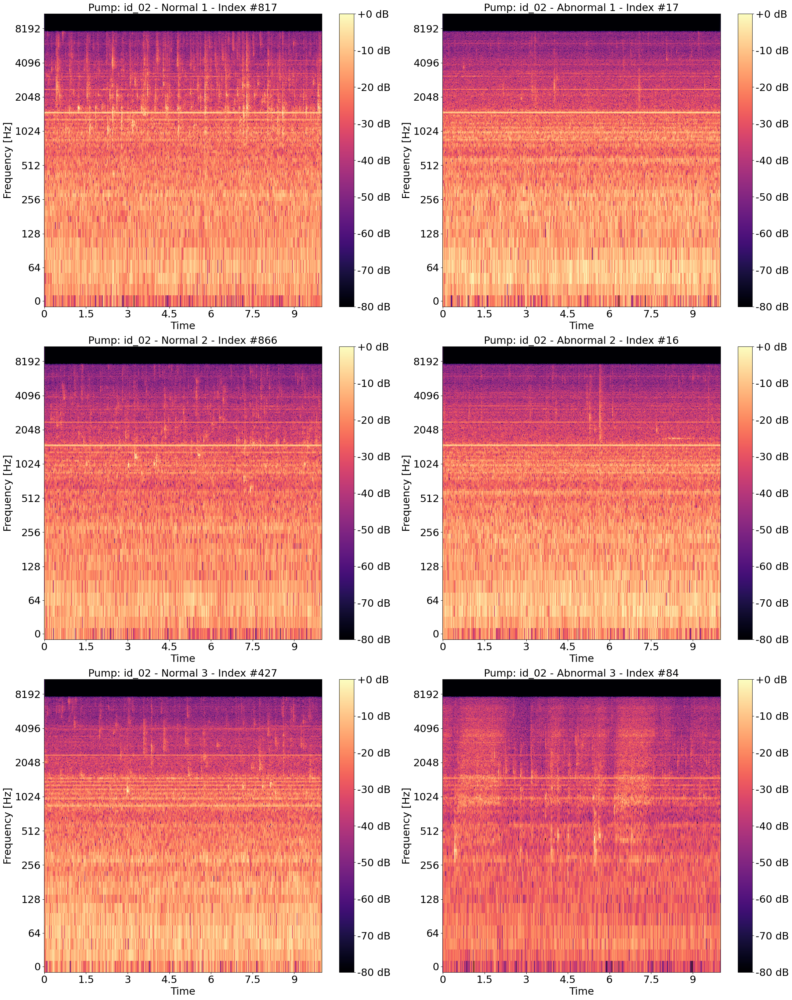

In [81]:
plot_examples(six_02_norm, six_02_abnorm, n_examples=3, hop_length=512, n_fft=1024, random_samples=False)

plot_examples(six_02_norm, six_02_abnorm, n_examples=3, hop_length=512, n_fft=1024, random_samples=True)


# Normalization

In [6]:
def normalize_data(x, lb, ub, max_v=1.0, min_v=-1.0):
    '''
    Max-Min normalize of 'x' with max value 'max_v' min value 'min_v'
    '''

    # Set-up
    if len(ub)==0:
        ub = x.max(0) # OPTION 1
        # applied to the first dimension (0) columns of the data
        #ub = np.percentile(x, 99.9, axis=0, keepdims=True) # OPTION 2:
        
    if len(lb)==0:
        lb = x.min(0) 
        #lb = np.percentile(x, 0.1, axis=0, keepdims=True)
    
    ub.shape = (1,-1)
    lb.shape = (1,-1)           
    max_min = max_v - min_v
    delta = ub-lb

    # Compute
    x_n = max_min * (x - lb) / delta + min_v
    if 0 in delta:
        idx = np.ravel(delta == 0)
        x_n[:,idx] = x[:,idx] - lb[:, idx]

    return x_n, lb, ub 

## Normalize six_norm_data & six_abnorm_data

In [26]:
six_norm_data_n, lb, ub = normalize_data(six_norm_data, [], [], max_v=1.0, min_v=0.0)
print(six_norm_data_n)

six_abnorm_data_n, lb, ub = normalize_data(six_abnorm_data, [], [], max_v=1.0, min_v=0.0)
print(six_abnorm_data_n)


[[0.50680536 0.49459252 0.5638561  ... 0.52019787 0.5181766  0.5108569 ]
 [0.6925782  0.6364584  0.70216686 ... 0.5696227  0.57920265 0.6265522 ]
 [0.65501666 0.5968383  0.70810354 ... 0.5323048  0.5360604  0.5510274 ]
 ...
 [0.73291856 0.76494384 0.623315   ... 0.28893778 0.29114878 0.24939412]
 [0.7974568  0.69309485 0.67207146 ... 0.30297497 0.2746842  0.2960698 ]
 [0.8139511  0.7084099  0.6487108  ... 0.25420263 0.2499758  0.27348074]]
[[0.33771682 0.27785784 0.26559427 ... 0.18123129 0.19518875 0.1974282 ]
 [0.28140482 0.26396242 0.3544001  ... 0.19414781 0.20980471 0.2064001 ]
 [0.31561092 0.3216098  0.32545492 ... 0.16656087 0.18521224 0.214315  ]
 ...
 [0.8104279  0.81536496 0.9197512  ... 0.13417602 0.16365665 0.20735407]
 [0.9157321  0.85799456 0.8580185  ... 0.1800388  0.1731957  0.19838832]
 [0.78237855 0.8666426  0.8218058  ... 0.17870124 0.17531979 0.22040789]]


## Normalize zero_norm_data & zero_abnorm_data

In [21]:
zero_norm_data_n, lb, ub = normalize_data(zero_norm_data, [], [], max_v=1.0, min_v=0.0)
print(zero_norm_data_n)

zero_abnorm_data_n, lb, ub = normalize_data(zero_abnorm_data, [], [], max_v=1.0, min_v=0.0)
print(zero_abnorm_data_n)

[[0.73728985 0.6460692  0.6629794  ... 0.545584   0.5388521  0.5102194 ]
 [0.84888244 0.80061233 0.8206129  ... 0.5823232  0.58611345 0.63554174]
 [0.87091136 0.8329002  0.7845577  ... 0.5610259  0.5632584  0.56067055]
 ...
 [0.73154956 0.59380925 0.6603504  ... 0.42220742 0.4071814  0.39943376]
 [0.83514744 0.7438794  0.7477194  ... 0.4088267  0.4015441  0.3715983 ]
 [0.78377706 0.6427157  0.6818675  ... 0.39093718 0.36927816 0.35829687]]
[[0.21201208 0.20135647 0.41367725 ... 0.27449733 0.30214995 0.25236645]
 [0.13641445 0.24955566 0.4225957  ... 0.32315472 0.3496258  0.2702812 ]
 [0.37400025 0.29043868 0.30046636 ... 0.2767254  0.2720074  0.27716863]
 ...
 [0.6763414  0.66216755 0.70358616 ... 0.17621449 0.25031874 0.2118691 ]
 [0.6945502  0.67943084 0.74083847 ... 0.18252513 0.22859316 0.19748057]
 [0.7195341  0.64461404 0.5890883  ... 0.24996601 0.22669643 0.20041929]]


## Normalize min_six_norm_data & min_six_abnorm_data

In [11]:
min_six_norm_data_n, lb, ub = normalize_data(min_six_norm_data, [], [], max_v=1.0, min_v=0.0)
print(min_six_norm_data_n)

min_six_abnorm_data_n, lb, ub = normalize_data(min_six_abnorm_data, [], [], max_v=1.0, min_v=0.0)
print(min_six_abnorm_data_n)

[[0.6569681  0.5659254  0.2635445  ... 0.7291967  0.6602214  0.6963374 ]
 [0.7873399  0.64469767 0.57486385 ... 0.7645949  0.67001164 0.68628687]
 [0.8513689  0.8421368  0.7604471  ... 0.7424327  0.6821549  0.6961556 ]
 ...
 [0.69251037 0.6237313  0.65007997 ... 0.310776   0.28513685 0.2838351 ]
 [0.8271615  0.7289344  0.70142776 ... 0.308973   0.26508662 0.24437788]
 [0.7763617  0.5538253  0.6301431  ... 0.26168513 0.26464155 0.2786872 ]]
[[0.4966817  0.45213732 0.42021698 ... 0.36588326 0.41291067 0.4217828 ]
 [0.60483867 0.60773075 0.49371117 ... 0.41041663 0.4147385  0.46495876]
 [0.61299056 0.6549583  0.56729513 ... 0.36044297 0.35666853 0.4023349 ]
 ...
 [0.8083546  0.8051729  0.5175074  ... 0.47991404 0.463165   0.49181813]
 [0.7142188  0.696057   0.7479872  ... 0.46006334 0.4978686  0.42265517]
 [0.78518265 0.75040793 0.56451887 ... 0.42667258 0.48822173 0.46884155]]


## Normalize id00_all_dB_norm_data &  id00_all_dB_abnorm_data

In [7]:
id00_all_dB_norm_data_n, lb, ub = normalize_data(id00_all_dB_norm_data, [], [], max_v=1.0, min_v=0.0)
print(id00_all_dB_norm_data_n)

id00_all_dB_abnorm_data_n, lb, ub = normalize_data(id00_all_dB_abnorm_data, [], [], max_v=1.0, min_v=0.0)
print(id00_all_dB_abnorm_data_n)

[[0.7248219  0.64752096 0.6492822  ... 0.5089349  0.47291443 0.45769018]
 [0.84171057 0.8014302  0.81332225 ... 0.552324   0.5250063  0.59273547]
 [0.86478496 0.8335857  0.7758017  ... 0.52717185 0.4998153  0.5120555 ]
 ...
 [0.8861617  0.79603726 0.76116824 ... 0.39174253 0.37004897 0.4290131 ]
 [0.79682314 0.7948978  0.77132213 ... 0.38873202 0.41400975 0.45692882]
 [0.7258957  0.7904793  0.8454667  ... 0.40187162 0.4470962  0.4262728 ]]
[[0.28324723 0.348433   0.47201142 ... 0.2427745  0.262492   0.26999846]
 [0.21448372 0.38775593 0.48004255 ... 0.28717238 0.30655408 0.28570822]
 [0.43059143 0.42111    0.37006402 ... 0.24480753 0.23451684 0.29174793]
 ...
 [0.91237235 0.8068247  0.7465579  ... 0.44246423 0.48808265 0.45472622]
 [0.787194   0.7659724  0.6353686  ... 0.44871184 0.45854664 0.443147  ]
 [0.8590614  0.8133385  0.8416329  ... 0.41942504 0.40954918 0.41194007]]


## Normalize id02_all_dB_norm_data &  id00_all_dB_abnorm_data


In [8]:
id02_all_dB_norm_data_n, lb, ub = normalize_data(id02_all_dB_norm_data, [], [], max_v=1.0, min_v=0.0)
print(id02_all_dB_norm_data_n)

id02_all_dB_abnorm_data_n, lb, ub = normalize_data(id02_all_dB_abnorm_data, [], [], max_v=1.0, min_v=0.0)
print(id02_all_dB_abnorm_data_n)

[[0.47835067 0.44126213 0.6284849  ... 0.40207207 0.458706   0.46390203]
 [0.8027262  0.77811295 0.7443005  ... 0.3926136  0.42995733 0.45446065]
 [0.68807423 0.67778003 0.80984074 ... 0.38492835 0.41724464 0.4173316 ]
 ...
 [0.70482975 0.720048   0.61743486 ... 0.23806682 0.27009466 0.22291428]
 [0.7261171  0.64283234 0.78592026 ... 0.20601276 0.27150986 0.27691212]
 [0.62694925 0.7862838  0.74097645 ... 0.24860528 0.30592677 0.28013143]]
[[0.5962145  0.48992836 0.33543316 ... 0.30802456 0.27157843 0.3307294 ]
 [0.722894   0.5472786  0.62392354 ... 0.25062415 0.32359076 0.3072995 ]
 [0.9137628  0.7718323  0.61908007 ... 0.3866891  0.39539632 0.3878062 ]
 ...
 [0.81169397 0.77890885 0.67280155 ... 0.7564721  0.75930715 0.81499195]
 [0.79182667 0.80960906 0.6998852  ... 0.7710155  0.78718436 0.8768825 ]
 [0.7904812  0.9047988  0.6676265  ... 0.7789206  0.7816551  0.8238413 ]]


## Normalize id04_all_dB_norm_data &  id00_all_dB_abnorm_data


In [9]:
id04_all_dB_norm_data_n, lb, ub = normalize_data(id04_all_dB_norm_data, [], [], max_v=1.0, min_v=0.0)
print(id04_all_dB_norm_data_n)

id04_all_dB_abnorm_data_n, lb, ub = normalize_data(id04_all_dB_abnorm_data, [], [], max_v=1.0, min_v=0.0)
print(id04_all_dB_abnorm_data_n)

[[0.7769286  0.8224548  0.69143766 ... 0.45937192 0.3923471  0.423719  ]
 [0.8086427  0.75296545 0.57855225 ... 0.42648685 0.3607123  0.38178498]
 [0.7364681  0.708553   0.48545697 ... 0.4217539  0.37455505 0.3971178 ]
 ...
 [0.8244456  0.82635194 0.7781669  ... 0.32135874 0.3595307  0.38627005]
 [0.8363327  0.6118937  0.7458087  ... 0.34716198 0.34690762 0.35220587]
 [0.79092556 0.70574766 0.8190642  ... 0.32823217 0.3695291  0.3720941 ]]
[[0.7214526  0.6611888  0.63799775 ... 0.48153082 0.4451818  0.45896912]
 [0.8099657  0.72089565 0.6567412  ... 0.47680265 0.47231784 0.49107674]
 [0.8419261  0.843821   0.7703941  ... 0.46028298 0.4691069  0.48329064]
 ...
 [0.5198146  0.46797845 0.3403272  ... 0.31944644 0.3392516  0.27911392]
 [0.38298663 0.46807337 0.5800337  ... 0.31914034 0.34049156 0.34496915]
 [0.5612524  0.5470447  0.63125056 ... 0.32161885 0.29092753 0.3139828 ]]


## Normalize id06_all_dB_norm_data &  id00_all_dB_abnorm_data


In [10]:
id06_all_dB_norm_data_n, lb, ub = normalize_data(id06_all_dB_norm_data, [], [], max_v=1.0, min_v=0.0)
print(id06_all_dB_norm_data_n)

id06_all_dB_abnorm_data_n, lb, ub = normalize_data(id06_all_dB_abnorm_data, [], [], max_v=1.0, min_v=0.0)
print(id06_all_dB_abnorm_data_n)

[[0.51208264 0.5347588  0.6526374  ... 0.4726001  0.42258543 0.4186649 ]
 [0.7245504  0.59233254 0.56239516 ... 0.44530043 0.4117797  0.4367423 ]
 [0.76666677 0.5144882  0.7705414  ... 0.4254771  0.39110804 0.40376875]
 ...
 [0.70319164 0.63623595 0.63310397 ... 0.3336553  0.3038864  0.3151119 ]
 [0.83316547 0.7379428  0.6869428  ... 0.3317199  0.2832344  0.27130675]
 [0.7841302  0.56865317 0.61219984 ... 0.28095868 0.28277597 0.30939677]]
[[0.56793547 0.5728064  0.54571277 ... 0.1741466  0.15461959 0.19806868]
 [0.7608988  0.7425497  0.7365419  ... 0.15963049 0.18534602 0.18283205]
 [0.88739413 0.7850211  0.6485749  ... 0.19223595 0.24617136 0.3642558 ]
 ...
 [0.78430325 0.7594933  0.5014147  ... 0.5518627  0.5158773  0.5760876 ]
 [0.6783535  0.6247938  0.73958176 ... 0.529036   0.5545305  0.49507406]
 [0.75822324 0.69188803 0.54999423 ... 0.4906393  0.54378575 0.54917413]]


# PCA

## PCA of 6dB - normal - all machines 

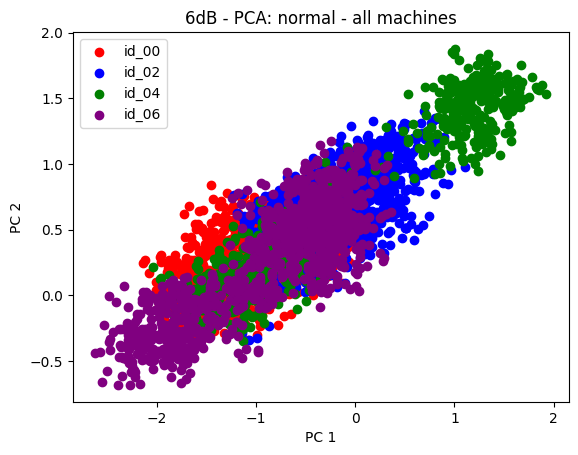

In [27]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(six_norm_data_n)
machine_ids = [os.path.dirname(file).split("\\")[-2] for file in six_norm]

colors = {"id_00": "red", "id_02": "blue", "id_04": "green", "id_06": "purple"}

fig, ax = plt.subplots()
for i, machine_id in enumerate(machine_ids):
    ax.scatter(pca_result[i, 0], pca_result[i, 1], color=colors[machine_id], label=machine_id)

# Create a legend with unique labels
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys())

ax.set_title(f'6dB - PCA: normal - all machines')
ax.set_xlabel("PC 1")
ax.set_ylabel("PC 2")
plt.show()


## PCA of 6dB - normal and abnormal - seperate machines

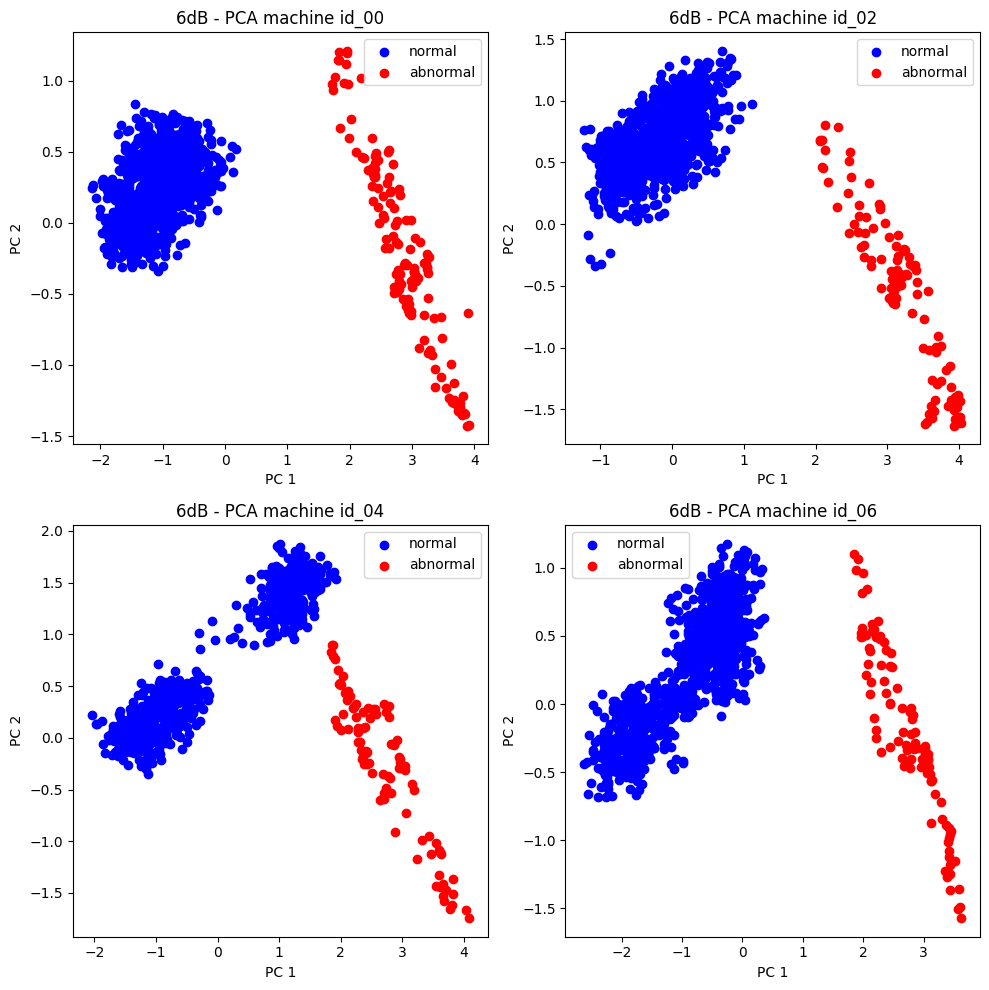

In [28]:
# Perform PCA on normalized data
pca = PCA(n_components=2)
pca_norm_result = pca.fit_transform(six_norm_data_n)
pca_abnorm_result = pca.fit_transform(six_abnorm_data_n)

# Create scatter plots for each machine ID with normal and abnormal data
machine_ids = ['id_00', 'id_02', 'id_04', 'id_06']
colors = {"normal": "blue", "abnormal": "red"}

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for idx, machine_id in enumerate(machine_ids):
    ax = axs[idx // 2, idx % 2]

    # Filter normal and abnormal data by machine ID
    norm_indices = [i for i, file in enumerate(six_norm) if machine_id in file]
    abnorm_indices = [i for i, file in enumerate(six_abnorm) if machine_id in file]

    # Plot normal data
    ax.scatter(pca_norm_result[norm_indices, 0], pca_norm_result[norm_indices, 1], color=colors["normal"], label="normal")
    # Plot abnormal data
    ax.scatter(pca_abnorm_result[abnorm_indices, 0], pca_abnorm_result[abnorm_indices, 1], color=colors["abnormal"], label="abnormal")

    ax.legend()
    ax.set_title(f'6dB - PCA machine {machine_id}')
    ax.set_xlabel("PC 1")
    ax.set_ylabel("PC 2")

plt.tight_layout()
plt.show()


## PCA of 0dB - normal - all machines 

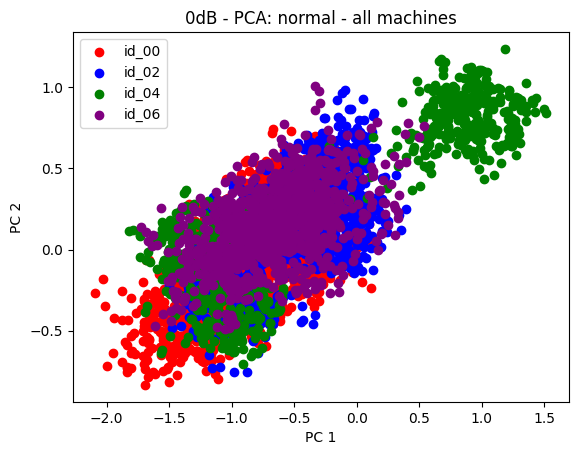

In [22]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(zero_norm_data_n)
machine_ids = [os.path.dirname(file).split("\\")[-2] for file in zero_norm]

colors = {"id_00": "red", "id_02": "blue", "id_04": "green", "id_06": "purple"}

fig, ax = plt.subplots()
for i, machine_id in enumerate(machine_ids):
    ax.scatter(pca_result[i, 0], pca_result[i, 1], color=colors[machine_id], label=machine_id)

# Create a legend with unique labels
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys())

ax.set_title(f'0dB - PCA: normal - all machines')
ax.set_xlabel("PC 1")
ax.set_ylabel("PC 2")
plt.show()

## PCA of 0dB - normal and abnormal - seperate machines

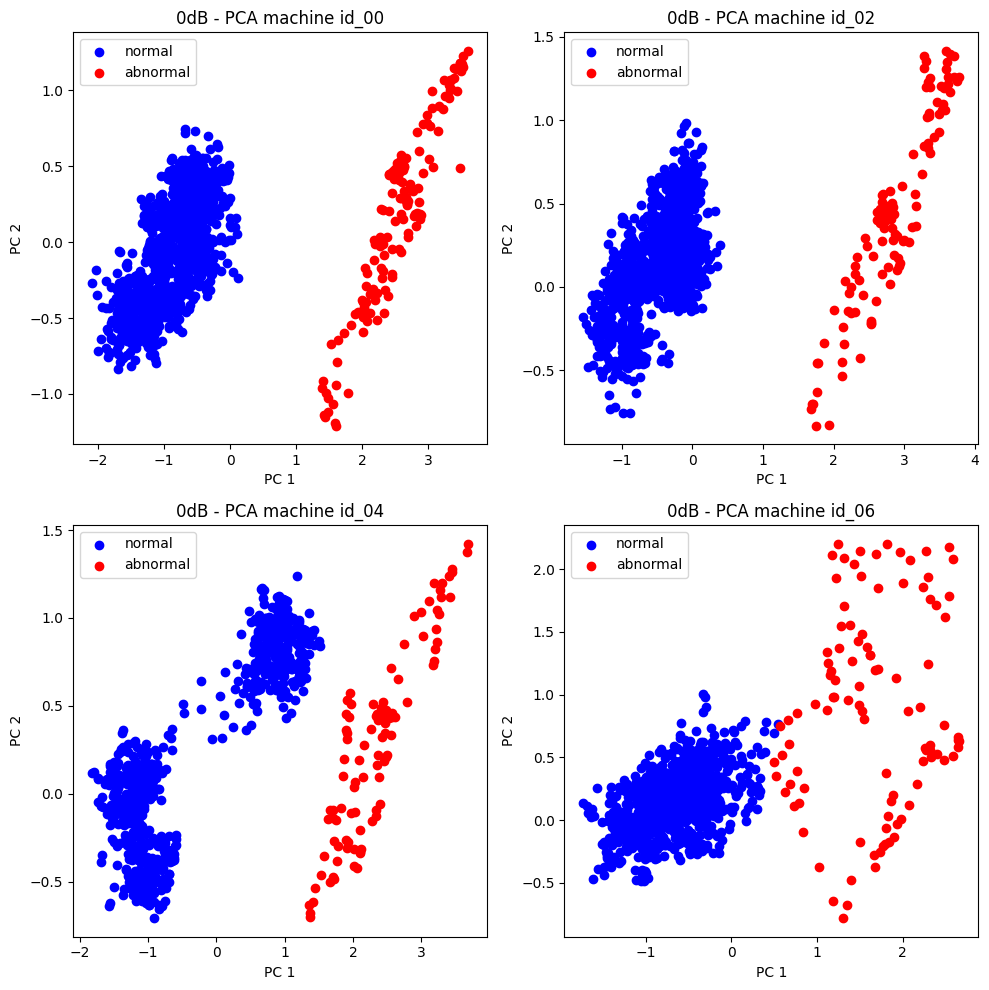

In [24]:
# Perform PCA on normalized data
pca = PCA(n_components=2)
pca_norm_result = pca.fit_transform(zero_norm_data_n)
pca_abnorm_result = pca.fit_transform(zero_abnorm_data_n)

# Create scatter plots for each machine ID with normal and abnormal data
machine_ids = ['id_00', 'id_02', 'id_04', 'id_06']
colors = {"normal": "blue", "abnormal": "red"}

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for idx, machine_id in enumerate(machine_ids):
    ax = axs[idx // 2, idx % 2]

    # Filter normal and abnormal data by machine ID
    norm_indices = [i for i, file in enumerate(zero_norm) if machine_id in file]
    abnorm_indices = [i for i, file in enumerate(zero_abnorm) if machine_id in file]

    # Plot normal data
    ax.scatter(pca_norm_result[norm_indices, 0], pca_norm_result[norm_indices, 1], color=colors["normal"], label="normal")
    # Plot abnormal data
    ax.scatter(pca_abnorm_result[abnorm_indices, 0], pca_abnorm_result[abnorm_indices, 1], color=colors["abnormal"], label="abnormal")

    ax.legend()
    ax.set_title(f'0dB - PCA machine {machine_id}')
    ax.set_xlabel("PC 1")
    ax.set_ylabel("PC 2")

plt.tight_layout()
plt.show()

## PCA of -6dB - normal - all machines 

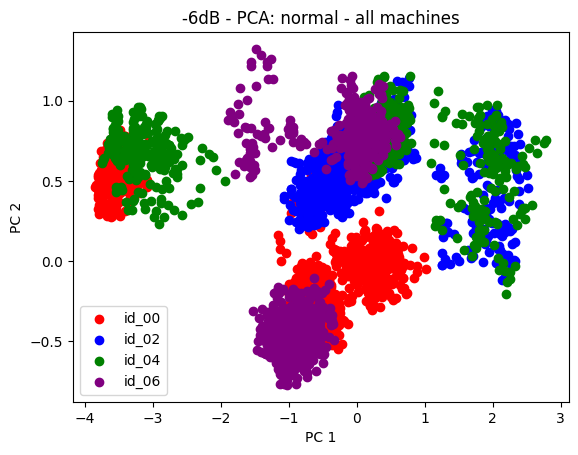

In [16]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(min_six_norm_data_n)
machine_ids = [os.path.dirname(file).split("\\")[-2] for file in min_six_norm]

colors = {"id_00": "red", "id_02": "blue", "id_04": "green", "id_06": "purple"}

fig, ax = plt.subplots()
for i, machine_id in enumerate(machine_ids):
    ax.scatter(pca_result[i, 0], pca_result[i, 1], color=colors[machine_id], label=machine_id)

# Create a legend with unique labels
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys())

ax.set_title(f'-6dB - PCA: normal - all machines')
ax.set_xlabel("PC 1")
ax.set_ylabel("PC 2")
plt.show()

## PCA of -6dB - normal and abnormal - seperate machines

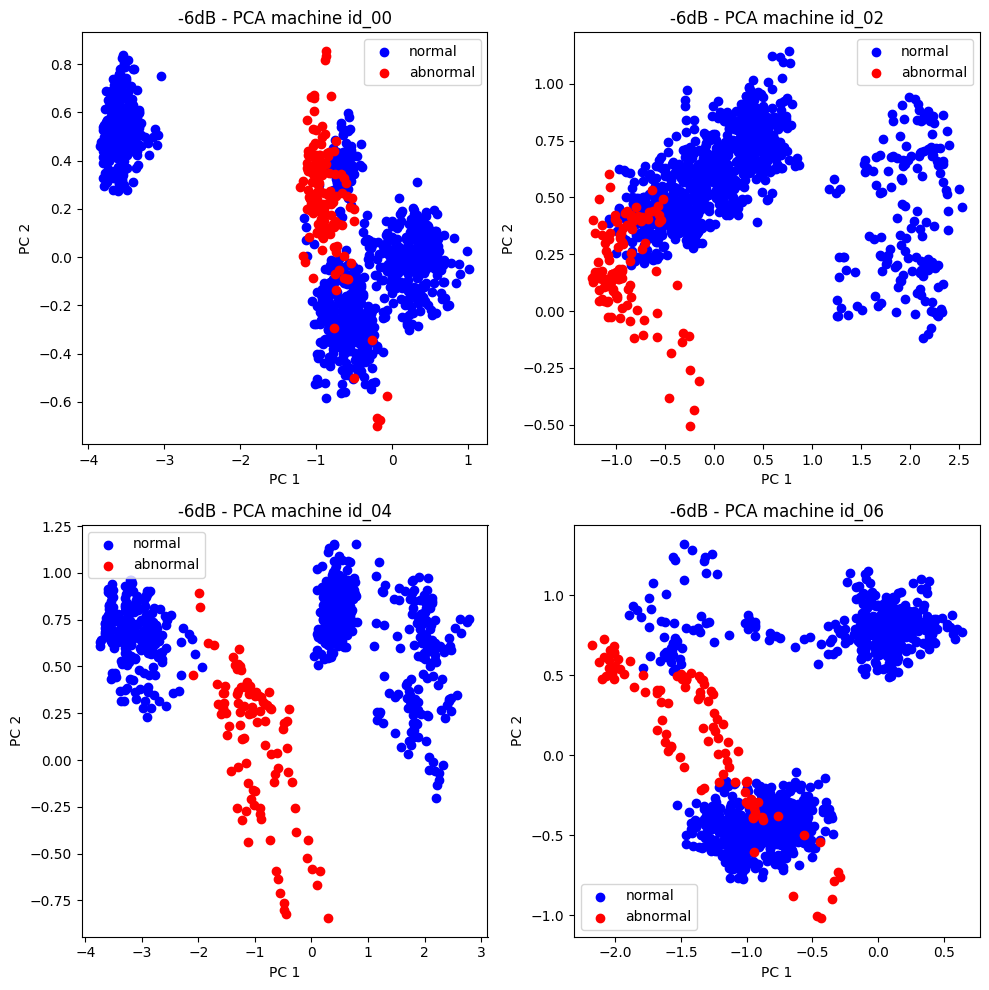

In [17]:
# Perform PCA on normalized data
pca = PCA(n_components=2)
pca_norm_result = pca.fit_transform(min_six_norm_data_n)
pca_abnorm_result = pca.fit_transform(min_six_abnorm_data_n)

# Create scatter plots for each machine ID with normal and abnormal data
machine_ids = ['id_00', 'id_02', 'id_04', 'id_06']
colors = {"normal": "blue", "abnormal": "red"}

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for idx, machine_id in enumerate(machine_ids):
    ax = axs[idx // 2, idx % 2]

    # Filter normal and abnormal data by machine ID
    norm_indices = [i for i, file in enumerate(min_six_norm) if machine_id in file]
    abnorm_indices = [i for i, file in enumerate(min_six_abnorm) if machine_id in file]

    # Plot normal data
    ax.scatter(pca_norm_result[norm_indices, 0], pca_norm_result[norm_indices, 1], color=colors["normal"], label="normal")
    # Plot abnormal data
    ax.scatter(pca_abnorm_result[abnorm_indices, 0], pca_abnorm_result[abnorm_indices, 1], color=colors["abnormal"], label="abnormal")

    ax.legend()
    ax.set_title(f'-6dB - PCA machine {machine_id}')
    ax.set_xlabel("PC 1")
    ax.set_ylabel("PC 2")

plt.tight_layout()
plt.show()

## PCA of id00_all_dB normal and abnormal

Pefroming this PCA to see the differences in dB of one machine

In [109]:
# def plot_pca_machine_db(six, zero, minus, m_id):
#     # Perform PCA
#     pca = PCA(n_components=2)
#     pca_6dB = pca.fit_transform(six)
#     pca_0dB = pca.fit_transform(zero)
#     pca_min6dB = pca.fit_transform(minus)


#     # Create scatter plot
#     fig, ax = plt.subplots(figsize=(10, 7))
#     ax.scatter(pca_6dB[:, 0], pca_6dB[:, 1], c='r', label='6dB', alpha=0.5)
#     ax.scatter(pca_0dB[:, 0], pca_0dB[:, 1], c='g', label='0dB', alpha=0.5)
#     ax.scatter(pca_min6dB[:, 0], pca_min6dB[:, 1], c='b', label='-6dB', alpha=0.5)

#     ax.set_title(f'PCA for Machine id{m_id} with Different dB Levels')
#     ax.legend()
#     plt.show()
    
# def sort_machine_dB(id_data, id_data_n):
#     # Separate the file names based on dB levels
#     id_data_files_6dB = [file for file in id_data if '6dB' in file]
#     id_data_files_0dB = [file for file in id_data if '0dB' in file]
#     id_data_files_min6dB = [file for file in id_data if 'min6dB' in file]

#     # Get the indices of the normal file names
#     indices_norm_6dB = [id_data.index(file) for file in id_data_files_6dB]
#     indices_norm_0dB = [id_data.index(file) for file in id_data_files_0dB]
#     indices_norm_min6dB = [id_data.index(file) for file in id_data_files_min6dB]

#     # Separate the data based on dB levels using indices
#     id_six = id_data_n[indices_norm_6dB]
#     id_zero = id_data_n[indices_norm_0dB]
#     id_min_six = id_data_n[indices_norm_min6dB]
    
#     return id_six, id_zero, id_min_six

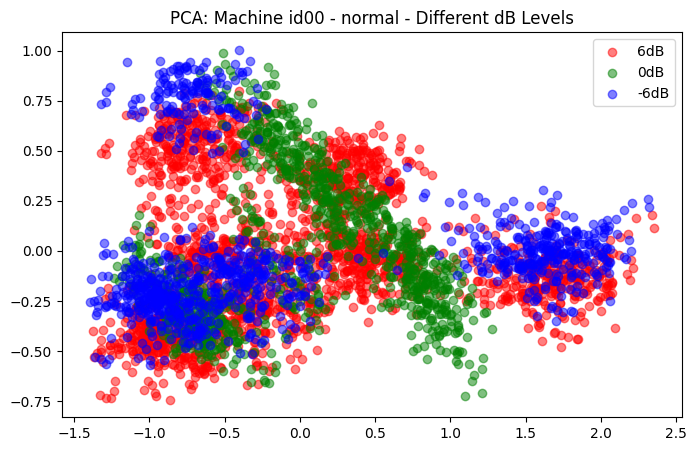

In [27]:
id_six, id_zero, id_min_six = sort_machine_dB(id00_all_dB_norm, id00_all_dB_norm_data_n)
plot_pca_machine_db(id_six, id_zero, id_min_six, '00', 'normal')

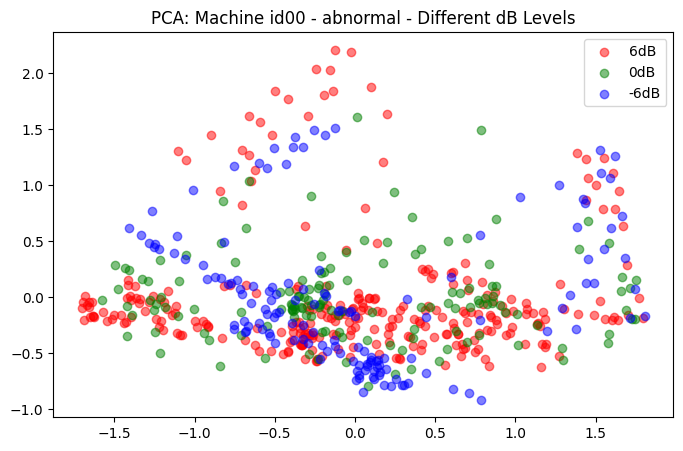

In [28]:
id_six, id_zero, id_min_six = sort_machine_dB(id00_all_dB_abnorm, id00_all_dB_abnorm_data_n)
plot_pca_machine_db(id_six, id_zero, id_min_six, '00', 'abnormal')


## PCA of id02_all_dB normal and abnormal


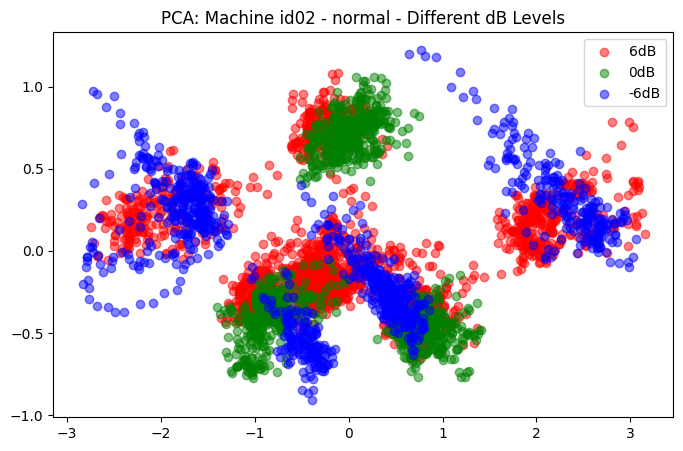

In [29]:
id_six, id_zero, id_min_six = sort_machine_dB(id02_all_dB_norm, id02_all_dB_norm_data_n)
plot_pca_machine_db(id_six, id_zero, id_min_six, '02', 'normal')

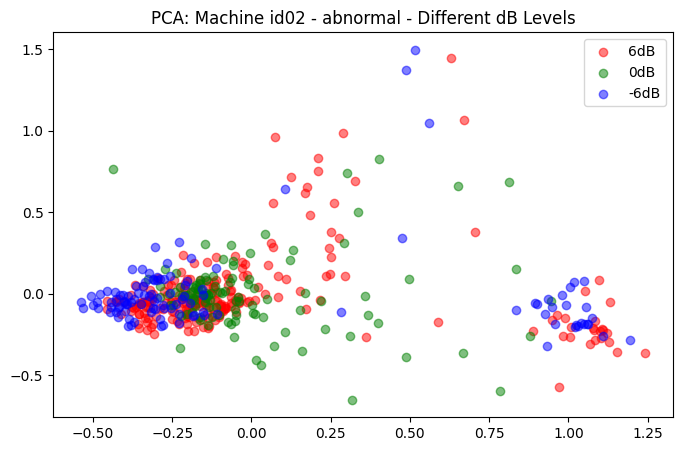

In [30]:
id_six, id_zero, id_min_six = sort_machine_dB(id02_all_dB_abnorm, id02_all_dB_abnorm_data_n)
plot_pca_machine_db(id_six, id_zero, id_min_six, '02', 'abnormal')

## PCA of id04_all_dB normal and abnormal


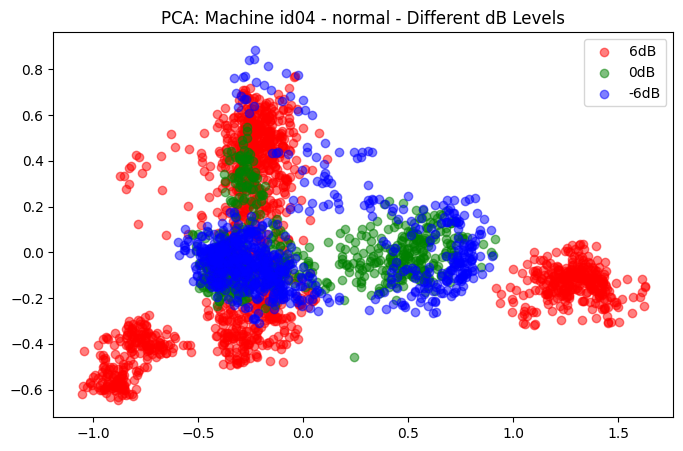

In [31]:
id_six, id_zero, id_min_six = sort_machine_dB(id04_all_dB_norm, id04_all_dB_norm_data_n)
plot_pca_machine_db(id_six, id_zero, id_min_six, '04', 'normal')

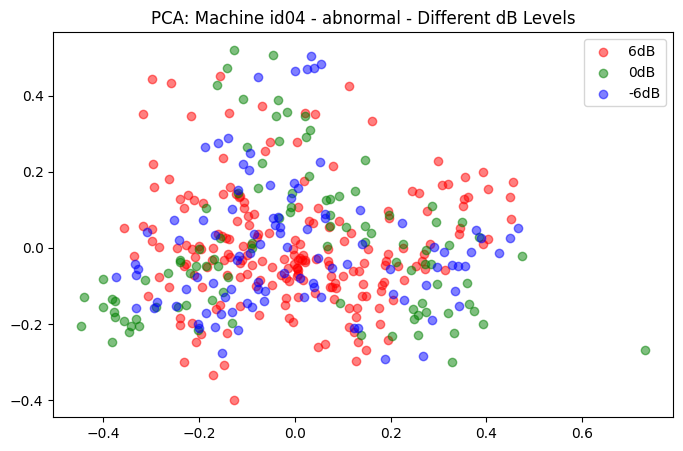

In [32]:
id_six, id_zero, id_min_six = sort_machine_dB(id04_all_dB_abnorm, id04_all_dB_abnorm_data_n)
plot_pca_machine_db(id_six, id_zero, id_min_six, '04', 'abnormal')

## PCA of id06_all_dB normal and abnormal


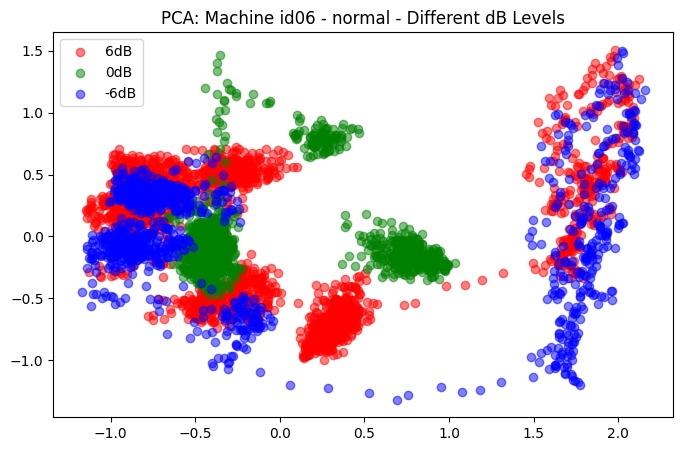

In [33]:
id_six, id_zero, id_min_six = sort_machine_dB(id06_all_dB_norm, id06_all_dB_norm_data_n)
plot_pca_machine_db(id_six, id_zero, id_min_six, '06', 'normal')

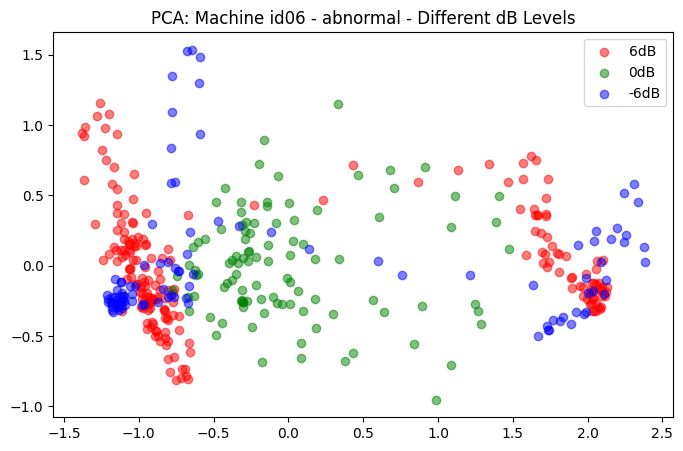

In [34]:
id_six, id_zero, id_min_six = sort_machine_dB(id06_all_dB_abnorm, id06_all_dB_abnorm_data_n)
plot_pca_machine_db(id_six, id_zero, id_min_six, '06', 'abnormal')

# SNR

Found the formula ond wiki:
https://en.wikipedia.org/wiki/Signal-to-noise_ratio


In [36]:
def snr(signal, noise):
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    return 10 * np.log10(signal_power / noise_power)

root = 'Z:/BA/mimii_baseline/dataset/'
machine_ids = ['id_00', 'id_02', 'id_04', 'id_06']
db_levels = ['6dB', '0dB', 'min6dB']

snr_results = {}

for db_level in db_levels:
    snr_results[db_level] = {}
    
    for machine_id in machine_ids:
        normal_files = file_names(root, db_levels=[db_level], ids=[machine_id], file_types=['normal'])
        abnormal_files = file_names(root, db_levels=[db_level], ids=[machine_id], file_types=['abnormal'])
        
        snr_values = []
        
        for normal_file, abnormal_file in zip(normal_files, abnormal_files):
            normal_signal, sr = librosa.load(normal_file)
            abnormal_signal, _ = librosa.load(abnormal_file)
            noise = abnormal_signal - normal_signal

            snr_value = snr(normal_signal, noise)
            snr_values.append(snr_value)

        snr_results[db_level][machine_id] = np.mean(snr_values)

print(snr_results)


{'6dB': {'id_00': -6.1915017924942335, 'id_02': -4.614859658318597, 'id_04': -3.2328827276825907, 'id_06': -3.6504575325285686}, '0dB': {'id_00': -5.352901505840408, 'id_02': -3.917491425265063, 'id_04': -3.103717267513275, 'id_06': -3.581993899801198}, 'min6dB': {'id_00': -4.194873320264416, 'id_02': -3.3888638241065516, 'id_04': -2.9295993335545063, 'id_06': -3.361794162614673}}


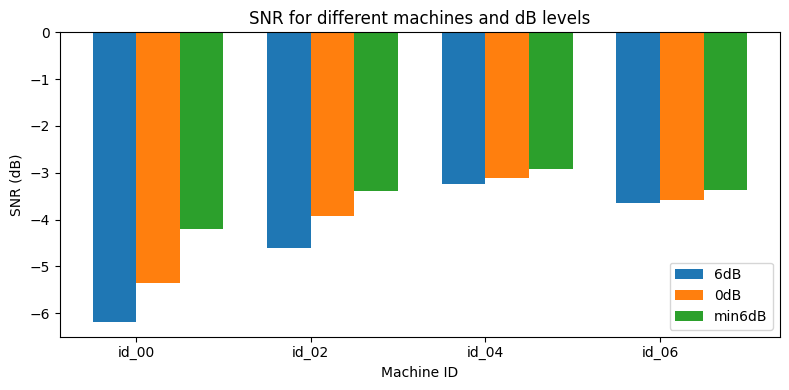

In [37]:
# Prepare data
dB_levels = list(snr_results.keys())
machine_ids = list(snr_results[dB_levels[0]].keys())
snr_values = [[snr_results[dB_level][machine_id] for machine_id in machine_ids] for dB_level in dB_levels]

# Plot
fig, ax = plt.subplots(figsize=(8, 4))
bar_width = 0.25
x = np.arange(len(machine_ids))

for i, (dB_level, values) in enumerate(zip(dB_levels, snr_values)):
    ax.bar(x + i * bar_width, values, width=bar_width, label=dB_level)

ax.set_ylabel('SNR (dB)')
ax.set_xlabel('Machine ID')
ax.set_title('SNR for different machines and dB levels')
ax.set_xticks(x + bar_width / 2)
ax.set_xticklabels(machine_ids)
ax.legend()

plt.tight_layout()
plt.show()

I'm not sure what to do with the results or how i should interpret it:

negative SNR level means more noise is present in the signal, the noise level is higher than the signal level
--> 6dB should have the highest noise level


on lower dB levels the noise is lower because the SNR gets lower.

blue 6dB should have the highest noise level compared to the others?

green min6dB should have the lowest noise level

within the group 6dB (which has the highest noise level), machine id_04 should perfrom the best with the lowest noise level.
